In [4]:
import pandas as pd
print("Pandas imported successfully, version: "+pd.__version__)
pd.set_option('display.max_column',None)
pd.set_option('display.max_rows',None)
pd.set_option('display.max_seq_items',None)
pd.set_option('display.max_colwidth', 500)
pd.set_option('expand_frame_repr', True)
pd.set_option('display.width', 1000)
pd.options.display.float_format = '{:.1f}'.format
import scipy as sm
from scipy.stats import *
print("SciPy imported successfully, version: "+sm.__version__)
import numpy as np
print("Numpy imported successfully, version: "+np.__version__)
import seaborn as sns
print("Seaborn imported successfully, version: "+sns.__version__)
sns.set(style="whitegrid")

from sklearn.decomposition import PCA 

Pandas imported successfully, version: 0.25.1
SciPy imported successfully, version: 1.3.1
Numpy imported successfully, version: 1.16.5
Seaborn imported successfully, version: 0.9.0


In [5]:
data_all = pd.read_csv('C:\\Users\\Ruslanas\\Desktop\\Projektas_rutos\\openpowerlifting.csv', sep=',', index_col=False, low_memory=False)

data_all.head(5)

,Name,Sex,Event,Equipment,Age,AgeClass,Division,BodyweightKg,WeightClassKg,Squat1Kg,Squat2Kg,Squat3Kg,Squat4Kg,Best3SquatKg,Bench1Kg,Bench2Kg,Bench3Kg,Bench4Kg,Best3BenchKg,Deadlift1Kg,Deadlift2Kg,Deadlift3Kg,Deadlift4Kg,Best3DeadliftKg,TotalKg,Place,Wilks,McCulloch,Glossbrenner,IPFPoints,Tested,Country,Federation,Date,MeetCountry,MeetState,MeetName
0,Abbie Murphy,F,SBD,Wraps,29.0,24-34,F-OR,59.8,60,80.0,92.5,105.0,nan,105.0,45.0,50.0,55.0,nan,55.0,110.0,120.0,130.0,nan,130.0,290.0,4,324.2,324.2,286.4,511.1,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup
1,Abbie Tuong,F,SBD,Wraps,29.0,24-34,F-OR,58.5,60,100.0,110.0,120.0,nan,120.0,55.0,62.5,67.5,nan,67.5,130.0,140.0,145.0,nan,145.0,332.5,2,378.1,378.1,334.2,595.6,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup
2,Ainslee Hooper,F,B,Raw,40.0,40-44,F-OR,55.4,56,nan,nan,nan,nan,nan,27.5,32.5,-35.0,nan,32.5,nan,nan,nan,nan,nan,32.5,1,38.6,38.6,34.1,314.0,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup
3,Amy Moldenhauer,F,SBD,Wraps,23.0,20-23,F-OR,60.0,60,-105.0,-105.0,105.0,nan,105.0,67.5,72.5,-75.0,nan,72.5,132.5,-140.0,-140.0,nan,132.5,310.0,3,345.6,345.6,305.4,547.0,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup
4,Andrea Rowan,F,SBD,Wraps,45.0,45-49,F-OR,104.0,110,120.0,130.0,140.0,nan,140.0,70.0,75.0,80.0,nan,80.0,150.0,160.0,170.0,nan,170.0,390.0,3,321.2,338.9,274.6,550.1,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup


Patikrinsiu, ar skiriasi moterų iki 30 ir vyresnių rezultatai.

In [18]:
female_rows = data_all["Sex"] == "F"
jaunos_rows = data_all["Age"] < 30 
female1_data = data_all[female_rows][jaunos_rows]["IPFPoints"].dropna(axis=0, how='any', inplace=False)
vyresnes_rows = data_all["Age"] >= 30
female2_data = data_all[female_rows][vyresnes_rows]["IPFPoints"].dropna(axis=0, how='any', inplace=False)
(t, p) = ttest_ind(female1_data, female2_data)
print("P-Value for the measurement: "+str(p))


C:\Anaconda\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


P-Value for the measurement: 6.84720804559017e-118


C:\Anaconda\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """


In [46]:
iki30_data = data_all[female_rows][jaunos_rows]
virs_data = data_all[female_rows][vyresnes_rows]
virs_data.head(20)


C:\Anaconda\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.
C:\Anaconda\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


,Name,Sex,Event,Equipment,Age,AgeClass,Division,BodyweightKg,WeightClassKg,Squat1Kg,Squat2Kg,Squat3Kg,Squat4Kg,Best3SquatKg,Bench1Kg,Bench2Kg,Bench3Kg,Bench4Kg,Best3BenchKg,Deadlift1Kg,Deadlift2Kg,Deadlift3Kg,Deadlift4Kg,Best3DeadliftKg,TotalKg,Place,Wilks,McCulloch,Glossbrenner,IPFPoints,Tested,Country,Federation,Date,MeetCountry,MeetState,MeetName,ageCategory,AgeCategory
2,Ainslee Hooper,F,B,Raw,40.0,40-44,F-OR,55.4,56,nan,nan,nan,nan,nan,27.5,32.5,-35.0,nan,32.5,nan,nan,nan,nan,nan,32.5,1,38.6,38.6,34.1,314.0,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup,40-50,40-50
4,Andrea Rowan,F,SBD,Wraps,45.0,45-49,F-OR,104.0,110,120.0,130.0,140.0,nan,140.0,70.0,75.0,80.0,nan,80.0,150.0,160.0,170.0,nan,170.0,390.0,3,321.2,338.9,274.6,550.1,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup,40-50,40-50
5,April Alvarez,F,SBD,Wraps,37.0,35-39,F-OR,74.0,75,127.5,135.0,142.5,nan,142.5,72.5,77.5,82.5,nan,82.5,125.0,135.0,145.0,nan,145.0,370.0,5,354.7,354.7,312.2,596.2,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup,30-40,30-40
7,Belinda Moloney,F,SBD,Wraps,35.0,35-39,F-OR,80.4,82.5,120.0,130.0,140.0,nan,140.0,67.5,72.5,77.5,nan,77.5,125.0,140.0,152.5,nan,152.5,370.0,5,337.6,337.6,296.0,575.9,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup,30-40,30-40
8,Briony Williams,F,SBD,Wraps,36.0,35-39,F-OR,108.0,110,180.0,200.0,220.0,nan,220.0,90.0,100.0,nan,nan,100.0,200.0,nan,nan,nan,200.0,520.0,1,424.5,424.5,361.6,716.6,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup,30-40,30-40
9,Brooke Kowalczyk,F,SBD,Wraps,37.0,35-39,F-OR,74.8,75,180.0,190.0,200.0,nan,200.0,90.0,95.0,-97.5,nan,95.0,160.0,170.0,180.0,nan,180.0,475.0,1,452.3,452.3,397.9,762.4,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup,30-40,30-40
10,Carmen Daldry,F,SBD,Wraps,34.0,24-34,F-OR,82.0,82.5,175.0,185.0,-195.0,nan,185.0,85.0,-90.0,-90.0,nan,85.0,180.0,192.5,-202.5,nan,192.5,462.5,2,417.6,417.6,365.6,712.9,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup,30-40,30-40
13,Deborah Carmody,F,SBD,Wraps,38.0,35-39,F-OR,74.7,75,-170.0,170.0,-177.5,nan,170.0,92.5,95.0,-97.5,nan,95.0,200.0,207.5,-210.0,nan,207.5,472.5,2,450.3,450.3,396.2,758.9,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup,30-40,30-40
15,Eve Lundmark-Bourke,F,SBD,Wraps,30.0,24-34,F-OR,108.1,110,135.0,142.5,147.5,nan,147.5,65.0,70.0,-72.5,nan,70.0,140.0,152.5,157.5,nan,157.5,375.0,4,306.1,306.1,260.7,522.7,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup,30-40,30-40
16,Helene Faccio,F,SBD,Wraps,50.0,50-54,F-OR,55.2,56,130.0,137.5,-142.5,nan,137.5,65.0,70.0,-72.5,nan,70.0,160.0,172.5,182.5,nan,182.5,390.0,1,464.1,524.4,410.6,724.8,NaN,Australia,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup,50-60,50-60


In [15]:
iki30_data["IPFPoints"].mean()

510.4225853075526

In [16]:
virs_data["IPFPoints"].mean()

522.7356267831882

Suskirstysiu atletus į amžiaus kategorijas ir pagal boxplot nustatysiu kuriame amžiuje pasiekiami aukščiausi rezultatai.

In [54]:
def Age_calculate(x):
    if(x < 10.0):
        return "05-10"
    if(x >= 10.0 and x < 20.0):
        return "10-20"
    if(x >= 20.0 and x < 30.0):
        return "20-30"
    if(x >= 30.0 and x < 40.0):
        return "30-40"
    if(x >= 40.0 and x < 50.0):
        return "40-50"
    if(x >= 50.0 and x < 60.0):
        return "50-60"
    if(x >= 60.0 and x < 70.0):
        return "60-70"
    if(x >= 70.0 and x < 80.0):
        return "70-80"
    if(x >= 80.0 and x < 90.0):
        return "80-90"
    else:
        return "90-100"
    
data_all['AgeCategory'] = pd.DataFrame(data_all.Age.apply(lambda x : Age_calculate(x)))
data_all.head()

,Name,Sex,Event,Equipment,Age,AgeClass,Division,BodyweightKg,WeightClassKg,Squat1Kg,Squat2Kg,Squat3Kg,Squat4Kg,Best3SquatKg,Bench1Kg,Bench2Kg,Bench3Kg,Bench4Kg,Best3BenchKg,Deadlift1Kg,Deadlift2Kg,Deadlift3Kg,Deadlift4Kg,Best3DeadliftKg,TotalKg,Place,Wilks,McCulloch,Glossbrenner,IPFPoints,Tested,Country,Federation,Date,MeetCountry,MeetState,MeetName,AgeCategory
0,Abbie Murphy,F,SBD,Wraps,29.0,24-34,F-OR,59.8,60,80.0,92.5,105.0,nan,105.0,45.0,50.0,55.0,nan,55.0,110.0,120.0,130.0,nan,130.0,290.0,4,324.2,324.2,286.4,511.1,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup,20-30
1,Abbie Tuong,F,SBD,Wraps,29.0,24-34,F-OR,58.5,60,100.0,110.0,120.0,nan,120.0,55.0,62.5,67.5,nan,67.5,130.0,140.0,145.0,nan,145.0,332.5,2,378.1,378.1,334.2,595.6,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup,20-30
3,Amy Moldenhauer,F,SBD,Wraps,23.0,20-23,F-OR,60.0,60,-105.0,-105.0,105.0,nan,105.0,67.5,72.5,-75.0,nan,72.5,132.5,-140.0,-140.0,nan,132.5,310.0,3,345.6,345.6,305.4,547.0,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup,20-30
4,Andrea Rowan,F,SBD,Wraps,45.0,45-49,F-OR,104.0,110,120.0,130.0,140.0,nan,140.0,70.0,75.0,80.0,nan,80.0,150.0,160.0,170.0,nan,170.0,390.0,3,321.2,338.9,274.6,550.1,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup,40-50
5,April Alvarez,F,SBD,Wraps,37.0,35-39,F-OR,74.0,75,127.5,135.0,142.5,nan,142.5,72.5,77.5,82.5,nan,82.5,125.0,135.0,145.0,nan,145.0,370.0,5,354.7,354.7,312.2,596.2,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup,30-40


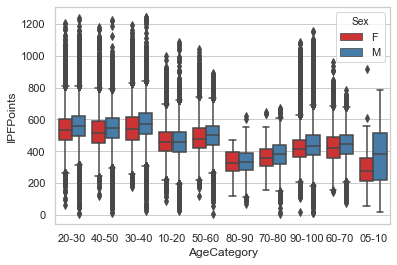

In [45]:
ax = sns.boxplot(x="AgeCategory", y="IPFPoints", hue = "Sex", data=data_all, palette="Set1")

Ieškau koreliacijos:

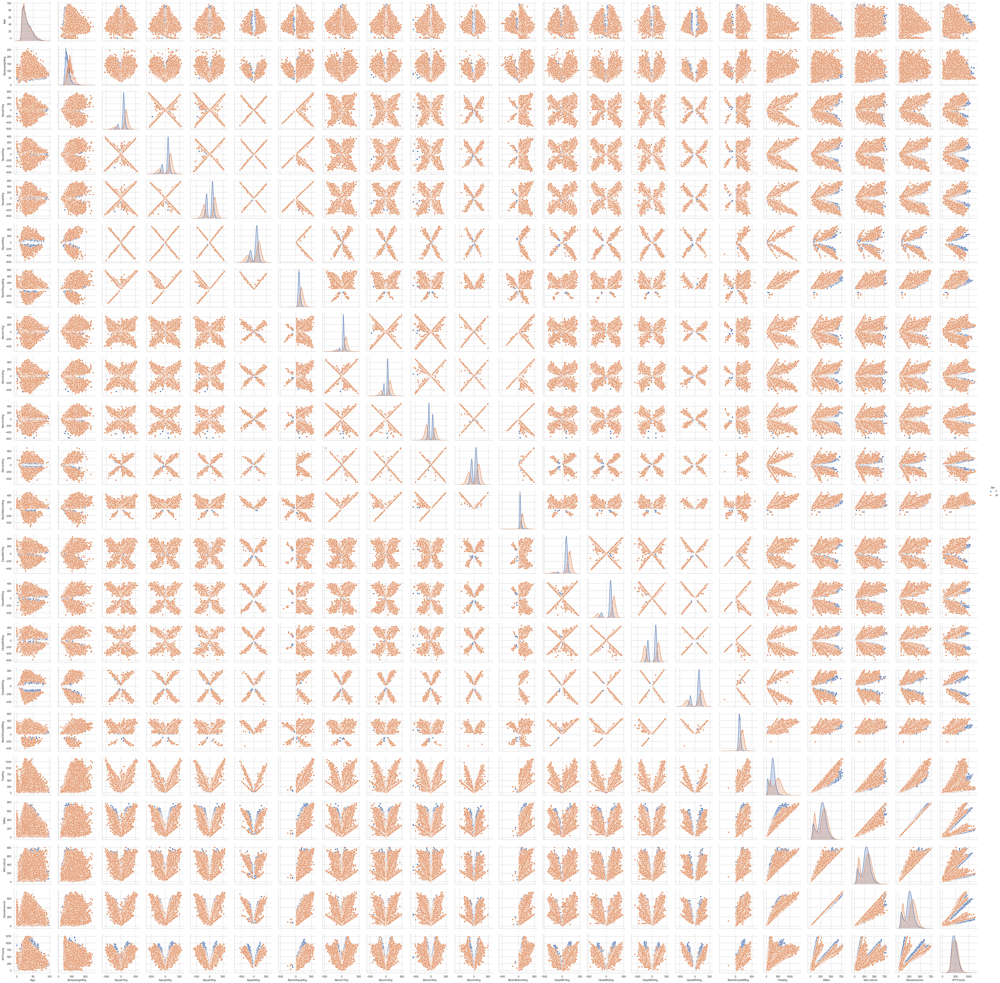

In [8]:
sns.pairplot(data_all, hue="Sex")


In [10]:
data_all = data_all[(data_all['Best3SquatKg'] > 0) | (data_all['Best3SquatKg'].isnull() == True)]
data_all = data_all[(data_all['Best3BenchKg'] > 0) | (data_all['Best3BenchKg'].isnull() == True)]
data_all = data_all[(data_all['Best3DeadliftKg'] > 0) | (data_all['Best3DeadliftKg'].isnull() == True)]
data_all.head()

,Name,Sex,Event,Equipment,Age,AgeClass,Division,BodyweightKg,WeightClassKg,Squat1Kg,Squat2Kg,Squat3Kg,Squat4Kg,Best3SquatKg,Bench1Kg,Bench2Kg,Bench3Kg,Bench4Kg,Best3BenchKg,Deadlift1Kg,Deadlift2Kg,Deadlift3Kg,Deadlift4Kg,Best3DeadliftKg,TotalKg,Place,Wilks,McCulloch,Glossbrenner,IPFPoints,Tested,Country,Federation,Date,MeetCountry,MeetState,MeetName,AgeCategory
0,Abbie Murphy,F,SBD,Wraps,29.0,24-34,F-OR,59.8,60,80.0,92.5,105.0,nan,105.0,45.0,50.0,55.0,nan,55.0,110.0,120.0,130.0,nan,130.0,290.0,4,324.2,324.2,286.4,511.1,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup,20-30
1,Abbie Tuong,F,SBD,Wraps,29.0,24-34,F-OR,58.5,60,100.0,110.0,120.0,nan,120.0,55.0,62.5,67.5,nan,67.5,130.0,140.0,145.0,nan,145.0,332.5,2,378.1,378.1,334.2,595.6,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup,20-30
2,Ainslee Hooper,F,B,Raw,40.0,40-44,F-OR,55.4,56,nan,nan,nan,nan,nan,27.5,32.5,-35.0,nan,32.5,nan,nan,nan,nan,nan,32.5,1,38.6,38.6,34.1,314.0,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup,40-50
3,Amy Moldenhauer,F,SBD,Wraps,23.0,20-23,F-OR,60.0,60,-105.0,-105.0,105.0,nan,105.0,67.5,72.5,-75.0,nan,72.5,132.5,-140.0,-140.0,nan,132.5,310.0,3,345.6,345.6,305.4,547.0,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup,20-30
4,Andrea Rowan,F,SBD,Wraps,45.0,45-49,F-OR,104.0,110,120.0,130.0,140.0,nan,140.0,70.0,75.0,80.0,nan,80.0,150.0,160.0,170.0,nan,170.0,390.0,3,321.2,338.9,274.6,550.1,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup,40-50


In [3]:
data_all.drop(['Squat4Kg','Bench4Kg','Deadlift4Kg'],axis=1,inplace=True)
data_all.head

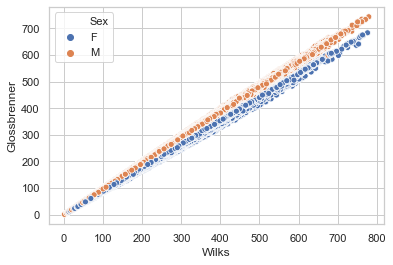

In [8]:
ax = sns.scatterplot(x="Wilks", y="Glossbrenner", hue='Sex', data=data_all)

In [10]:
slope, intercept, r_value, p_value, std_err = stats.linregress(data_all["Wilks"].dropna(axis=0, how='any', inplace=False), data_all["Glossbrenner"].dropna(axis=0, how='any', inplace=False))
print("Pearson R value is: %.5f"%r_value + " with a p-value of: %.5e"%p_value)

Pearson R value is: 0.99539 with a p-value of: 0.00000e+00


PCA

In [20]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
%matplotlib inline

In [48]:
data_all = data_all[(data_all['Best3SquatKg'] > 0)]
data_all = data_all[(data_all['Best3BenchKg'] > 0)]
data_all = data_all[(data_all['Best3DeadliftKg'] > 0)]
data_all = data_all[(data_all['TotalKg'] > 0)]

data_all.head()

,Name,Sex,Event,Equipment,Age,AgeClass,Division,BodyweightKg,WeightClassKg,Squat1Kg,Squat2Kg,Squat3Kg,Squat4Kg,Best3SquatKg,Bench1Kg,Bench2Kg,Bench3Kg,Bench4Kg,Best3BenchKg,Deadlift1Kg,Deadlift2Kg,Deadlift3Kg,Deadlift4Kg,Best3DeadliftKg,TotalKg,Place,Wilks,McCulloch,Glossbrenner,IPFPoints,Tested,Country,Federation,Date,MeetCountry,MeetState,MeetName
0,Abbie Murphy,F,SBD,Wraps,29.0,24-34,F-OR,59.8,60,80.0,92.5,105.0,nan,105.0,45.0,50.0,55.0,nan,55.0,110.0,120.0,130.0,nan,130.0,290.0,4,324.2,324.2,286.4,511.1,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup
1,Abbie Tuong,F,SBD,Wraps,29.0,24-34,F-OR,58.5,60,100.0,110.0,120.0,nan,120.0,55.0,62.5,67.5,nan,67.5,130.0,140.0,145.0,nan,145.0,332.5,2,378.1,378.1,334.2,595.6,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup
3,Amy Moldenhauer,F,SBD,Wraps,23.0,20-23,F-OR,60.0,60,-105.0,-105.0,105.0,nan,105.0,67.5,72.5,-75.0,nan,72.5,132.5,-140.0,-140.0,nan,132.5,310.0,3,345.6,345.6,305.4,547.0,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup
4,Andrea Rowan,F,SBD,Wraps,45.0,45-49,F-OR,104.0,110,120.0,130.0,140.0,nan,140.0,70.0,75.0,80.0,nan,80.0,150.0,160.0,170.0,nan,170.0,390.0,3,321.2,338.9,274.6,550.1,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup
5,April Alvarez,F,SBD,Wraps,37.0,35-39,F-OR,74.0,75,127.5,135.0,142.5,nan,142.5,72.5,77.5,82.5,nan,82.5,125.0,135.0,145.0,nan,145.0,370.0,5,354.7,354.7,312.2,596.2,NaN,NaN,GPC-AUS,2018-10-27,Australia,VIC,Melbourne Cup


In [34]:
results = ['Best3SquatKg', 'Best3BenchKg', 'Best3DeadliftKg', 'TotalKg']
x = data_all.loc[:, results].values

In [55]:
y = data_all.loc[:,['AgeCategory']].values

In [36]:
x = StandardScaler().fit_transform(x)

In [37]:
pd.DataFrame(data = x, columns = results).head()

,Best3SquatKg,Best3BenchKg,Best3DeadliftKg,TotalKg
0,-1.0,-1.1,-0.9,-1.1
1,-0.8,-0.9,-0.7,-0.8
2,-1.0,-0.8,-0.9,-0.9
3,-0.5,-0.6,-0.3,-0.5
4,-0.5,-0.5,-0.7,-0.6


In [38]:
pca = PCA(n_components=2)

In [39]:
principalComponents = pca.fit_transform(x)

In [40]:
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])

In [41]:
principalDf.head(5)

,principal component 1,principal component 2
0,-2.1,-0.1
1,-1.6,-0.1
2,-1.8,0.1
3,-0.9,-0.2
4,-1.1,0.1


In [56]:
data_all[['AgeCategory']].head()

,AgeCategory
0,20-30
1,20-30
3,20-30
4,40-50
5,30-40


In [63]:
finalDf = pd.concat([principalDf, data_all[['AgeCategory']]], axis = 1)
finalDf.head(5)

,principal component 1,principal component 2,AgeCategory
0,-2.1,-0.1,20-30
1,-1.6,-0.1,20-30
2,-1.8,0.1,NaN
3,-0.9,-0.2,20-30
4,-1.1,0.1,40-50


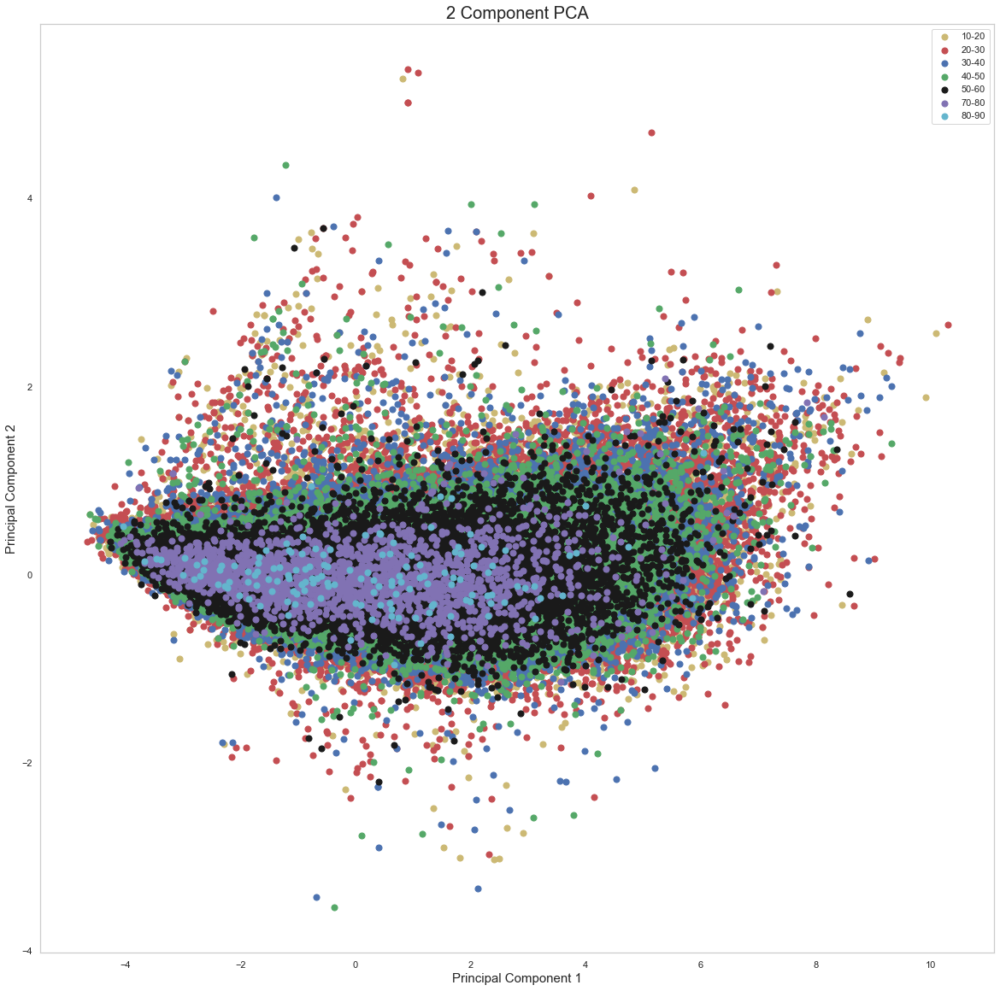

In [64]:
fig = plt.figure(figsize = (20,20))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 Component PCA', fontsize = 20)


targets = ['10-20','20-30', '30-40', '40-50', '50-60', '70-80', '80-90']
colors = ['y', 'r', 'b', 'g', 'k', 'm', 'c']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['AgeCategory'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

In [59]:
finalDf = pd.concat([principalDf, data_all[['Sex']]], axis = 1)
finalDf.head(5)

,principal component 1,principal component 2,Sex
0,-2.1,-0.1,F
1,-1.6,-0.1,F
2,-1.8,0.1,NaN
3,-0.9,-0.2,F
4,-1.1,0.1,F


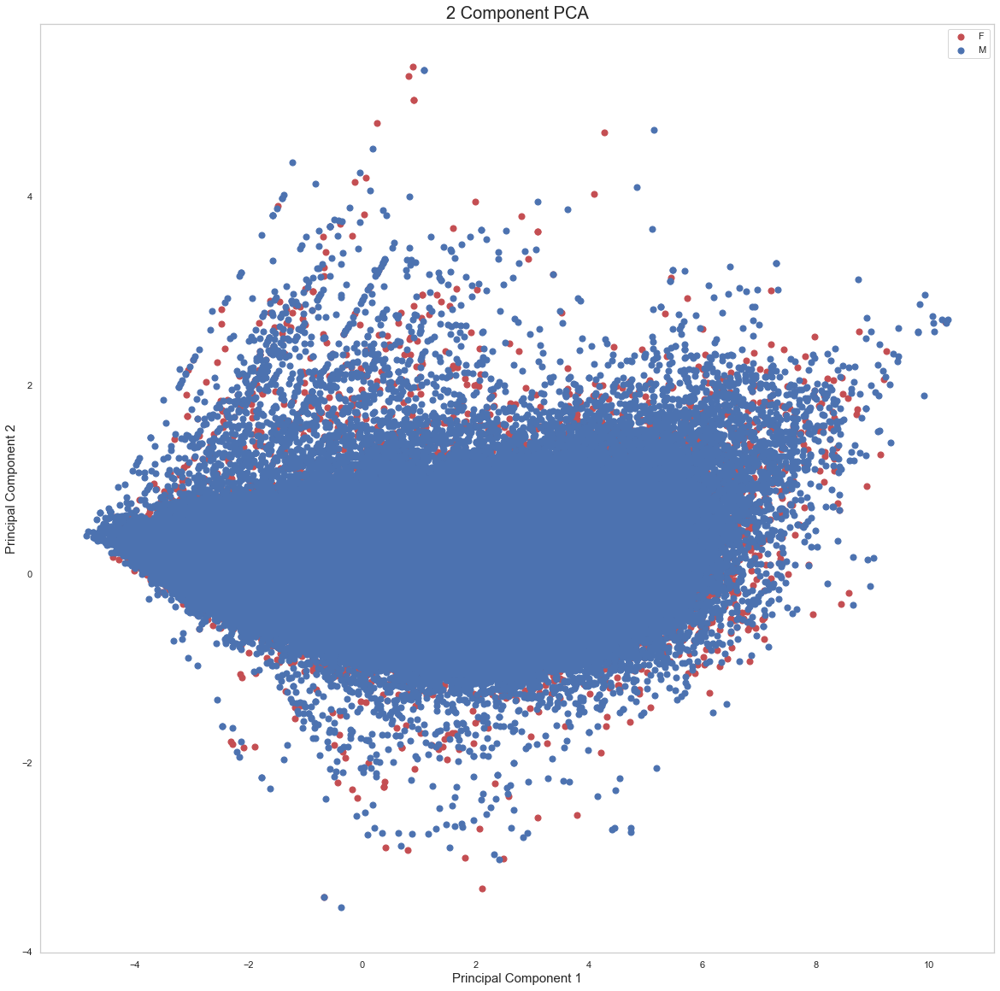

In [61]:
fig = plt.figure(figsize = (20,20))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 Component PCA', fontsize = 20)


targets = ['F', 'M']
colors = ['r', 'b']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['Sex'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

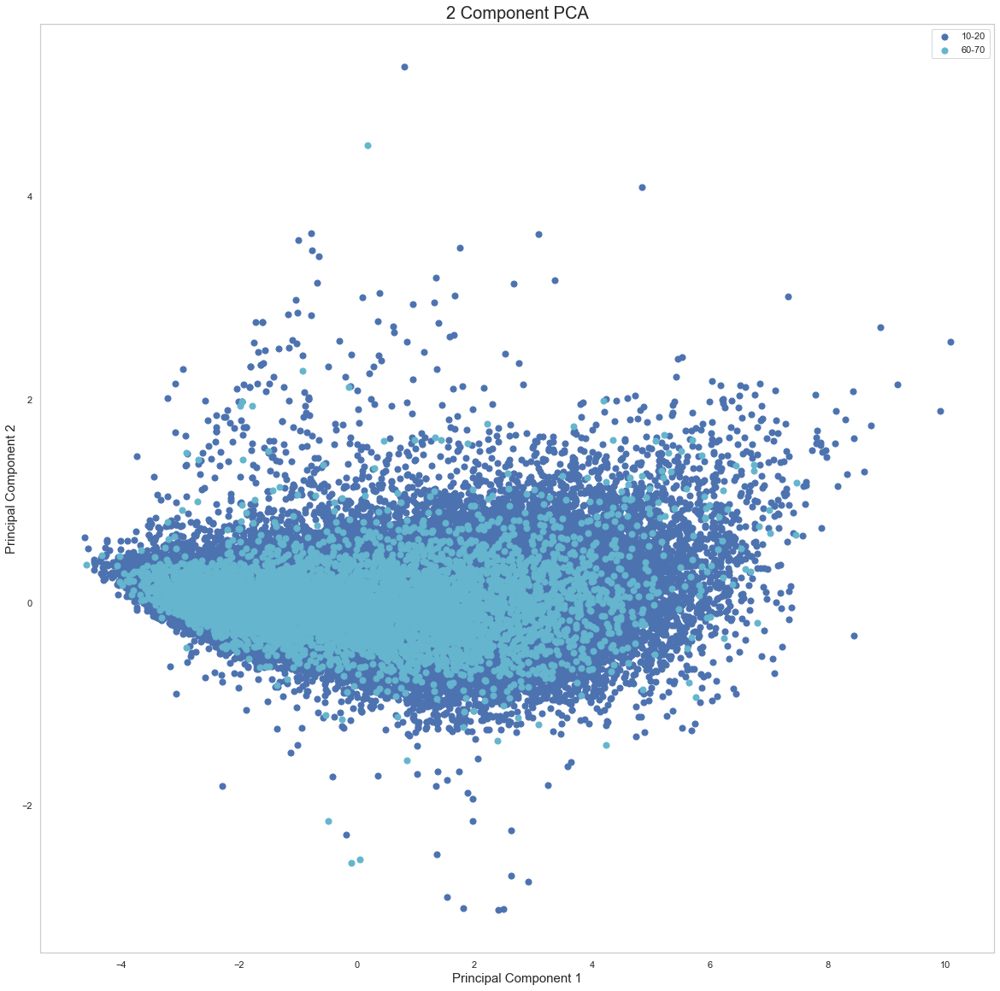

In [68]:
fig = plt.figure(figsize = (20,20))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 Component PCA', fontsize = 20)


targets = ['10-20','60-70']
colors = ['b','c']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['AgeCategory'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()